<a href="https://colab.research.google.com/github/songiangvn/AI-Machine-Learning-for-Coders/blob/main/Chapter_5_Introduction_to_Natural_Language_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Encoding Language into Numbers: Mã hóa ngôn ngữ thành số

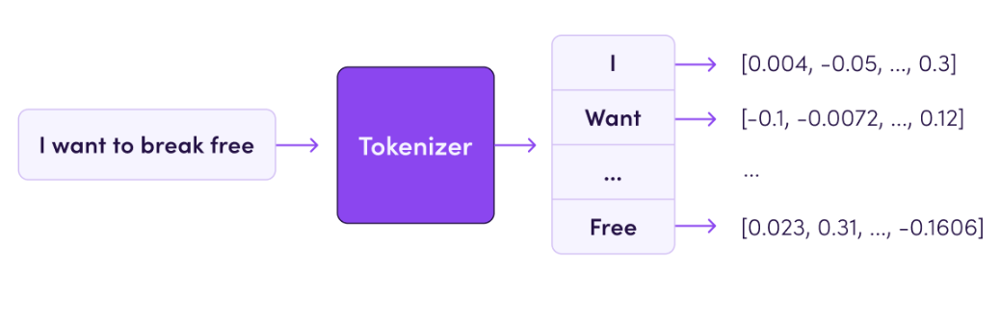

## Character Tokenizer(Mã hóa theo ký tự)

Mã hóa theo ký tự tức là mỗi ký tự sẽ tương ứng với một số. Qua đó, một từ hay một câu sẽ được biểu diễn thành một vector hoặc chuỗi số.  

Điển hình mà mọi người có thể thấy rõ nhất là bộ mã **ASCII** nha. 💻




VD. Chiếu theo bộ mã ASCII ta sẽ có:
- **"Dead is like the wind, always by my side"** -> [68, 101, 97, 100, 32, 105, 115, 32, 108, 105, 107, 101, 32, 116, 104, 101, 32, 119, 105, 110, 100, 44, 32, 97, 108, 119, 97, 121, 115, 32, 98, 121, 32, 109, 121, 32, 115, 105, 100, 101]



```python
D: 68
e: 101
a: 97
d: 100
 : 32
i: 105
s: 115
 : 32
l: 108
i: 105
k: 107
e: 101
 : 32
t: 116
h: 104
e: 101
 : 32
w: 119
i: 105
n: 110
d: 100
,: 44
 : 32
a: 97
l: 108
w: 119
a: 97
y: 121
s: 115
 : 32
b: 98
y: 121
 : 32
m: 109
y: 121
 : 32
s: 115
i: 105
d: 100
e: 101

```



Tuy nhiên, mọi người sẽ gặp phải một vấn đề nha. Trong một số trường hợp, mã hóa theo ký tự có thể gây ra hạn chế, ảnh hưởng đến hiệu quả của mô hình. 🚧  

Một số từ có cùng số lượng ký tự và các ký tự giống nhau nhưng chỉ thay đổi về thứ tự. Điều này làm cho mô hình gặp khó khăn trong việc hiểu được ý nghĩa thực sự của từ hoặc câu.  

Những trường hợp như vậy được gọi là **antigram**. 🔄  
Mình ví dụ một số từ như sau:  
- **Santa** - **Satan**  
- **restful** - **fluster**  
- **forty five** - **over fifty**  

Thậm chí, có một câu joke hơi dark dựa trên **antigram**:  
> **"Evangelist is the Evil's Agent."** 💀


Thay vào đó, tụi mình sẽ có một cách thay thế tốt hơn: **mã hóa theo từ**. 📝✨


## Mã hóa theo từ (Word Tokenizer) 📝  

Hiểu đơn giản là với mỗi từ, tụi mình sẽ gán một số để đại diện cho từ đó.  

```python
# "Caption Teemo on duty" -> [1, 2, 3, 4]
vocabulary = {
  "Caption": 1,
  "Teemo": 2,
  "on": 3,
  "duty": 4
}


This process is called ***tokenization***, and you’ll explore how to do that in code next.

### Getting Started with Tokenization

TensorFlow Keras contains a library called preprocessing that provides a number of
 extremely useful tools to prepare data for machine learning. One of these is a
 Tokenizer that will allow you to take words and turn them into tokens. Let’s see it in
 action with a simple example:

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.text import Tokenizer

org_texts = [
    "Today is a sunny day",
    "Today is a rainy day"
]


# Định nghĩa số lượng từ trong công cụ mã hóa (tokenizer)
tokenizer = Tokenizer(num_words = 100)
# Tiến hành đẩy các từ vào để tạo thư viện từ trong công cụ mã hóa.
tokenizer.fit_on_texts(org_texts)
# Lấy từ điển mã hóa ra
word_index = tokenizer.word_index
print(word_index)

{'today': 1, 'is': 2, 'a': 3, 'day': 4, 'sunny': 5, 'rainy': 6}


Như đây là kết quả của đoạn code ở trên nha, chúng ta sẽ lấy được từ điển mã hóa từ như sau: 📖  

```python
{'today': 1, 'is': 2, 'a': 3, 'day': 4, 'sunny': 5, 'rainy': 6}
```

Như mọi người thấy, mỗi từ sẽ được lưu lại và được đại diện bởi một con số mã hóa. 🔢  

Sau khi đẩy các chuỗi vào để tạo từ điển, tụi mình sẽ tiến hành mã hóa các chuỗi hay câu bằng hàm **texts_to_sequences** nha. 💻  
Mọi người chỉ cần chuyển một list các câu vào là được. ✅


In [2]:
sequences = tokenizer.texts_to_sequences(org_texts)
print(sequences)

[[1, 2, 3, 5, 4], [1, 2, 3, 6, 4]]


> **Vậy điểm hạn chế của phương pháp mã hóa theo từ là gì?** 🤔  

Như mọi người thấy, phương pháp này hoạt động dựa trên các từ có sẵn trong từ điển.  
Vậy, khi gặp những **từ mới** không có trong thư viện từ vựng, máy tính sẽ không thể phát hiện được và sẽ **bỏ qua** từ đó. Điều này dẫn đến việc mô hình học không đầy đủ và có thể bị nhầm lẫn ngữ cảnh. 🚧  

Ví dụ như đoạn code dưới đây: 💻  


In [3]:
# Tập kiểm tra
test_data = [
    "Today is a snowy day",
    "Will it be rainy tomorrow?"
]

# Tiến hành mã hóa
test_seq = tokenizer.texts_to_sequences(test_data)

# Kiểm tra kết quả mã hóa.
print(test_seq)

[[1, 2, 3, 4], [6]]


Như mọi người thấy kết quả mã hóa của 2 câu như sau:

```python
 "Today is a snowy day" - [1, 2, 3, 4]
 "Will it be rainy tomorrow?" - [6]
 ```
Độ dài của chuỗi sau mã hóa đã bị giảm đi rất nhiều, chúng chỉ mã hóa được những từ đã biết, nhưng từ chưa biết thì bỏ qua.

Chúng ta có tên gọi cụ thể của trường hợp này là  **Out of vocabulary**, tức nằm ngoài vùng từ vựng.

## Using Out of Vocabulary Tokens (Sử dụng các token cho từ vựng mới) 🆕📚  


> **Vậy chúng ta có thể giải quyết vấn đề "Out of Vocabulary" này như thế nào?** 🤔  

Có nhiều cách mã hóa cải tiến để khắc phục hoặc hạn chế ảnh hưởng của tình trạng này.  

Ở đây, mình chỉ giới thiệu cách đơn giản nhất thôi nha. Mọi người sẽ sử dụng một **token hay số** để đại diện cho các trường hợp **từ vựng không biết trước**. 🆕🔢  

Ở đây, mình sẽ sử dụng token là **< OOV >** nha. Mọi người cũng có thể đặt tên token là cái khác tùy ý.  
Trong một số mô hình hoặc đoạn code khác, mọi người có thể bắt gặp token này dưới dạng **< UNK >**, có nghĩa là **unknown - không biết**. ❓  


In [4]:
# Tiến hành định nghĩa lại bộ mã hóa, thêm vào token đại diện cho trường hợp từ không biết
tokenizer = Tokenizer(num_words=100, oov_token="<OOV>")
# Tiến hành đẩy các từ vào để tạo thư viện từ trong công cụ mã hóa.
tokenizer.fit_on_texts(org_texts)

# In từ điển bên trong bộ mã hóa ra
word_index = tokenizer.word_index
print(word_index)

{'<OOV>': 1, 'today': 2, 'is': 3, 'a': 4, 'day': 5, 'sunny': 6, 'rainy': 7}


**Ở đây mọi người sẽ thấy từ vựng không biết sẽ được đánh số mã hóa là 1**

In [5]:
# Tiến hành mã hóa lại các câu gặp phải trường hợp từ vựng không biết trước đó
test_seq = tokenizer.texts_to_sequences(test_data)
print(test_seq)

[[2, 3, 4, 1, 5], [1, 1, 1, 7, 1]]


Mọi người có thể thấy kết quả sau khi thêm vào token cho trường hợp từ vựng không biết:


```python
"Today is a snowy day" - [2, 3, 4, 1, 5]
 "Will it be rainy tomorrow?" - [1, 1, 1, 7, 1]
```



Tuy nó không phải là cách tối ưu nhất, nhưng chúng ta đã đi đúng hướng giải quyết rồi. 🚀  

Tiếp đến, tụi mình cùng tìm hiểu về **padding(phần đệm chuỗi)** nha. 🔢✨  


## Understanding padding

Hiểu đơn giản, **đệm chuỗi** nghĩa là **thêm các token vào chuỗi**. 🔢  

Như mọi người đã biết, dữ liệu khi đưa vào mô hình học tập **phải có kích thước giống nhau, tương ứng với kích thước đầu vào của mô hình**. 🛠️  

Ở các chương trước, khi chúng ta làm việc với dữ liệu dạng ảnh, chúng ta đã tiến hành điều chỉnh lại kích thước ảnh trước khi đưa vào mô hình. Bây giờ, khi xử lý dữ liệu dạng chuỗi, quy trình cũng tương tự như vậy. 🖼️➡️🔡  

Với dữ liệu dạng chuỗi, chúng ta sẽ thêm vào các token để đại diện cho những phần tử được đệm thêm vào, với mục đích làm cho độ dài các chuỗi đều tương đương nhau. Token này thường được thấy dưới dạng **< PAD >** trong các mô hình xử lý. 🧩  

Nói đủ nhiều rồi, bây giờ tụi mình sẽ đi vào code xử lý cụ thể nha. 💻✨  


In [6]:
# Các câu văn cần mã hóa để đưa vào mô hình
sentences = [
  "Today is a sunny day",
  "Today is a rainy day",
  "Is it sunny today?",
  "I really enjoyed walking in the snow today"
]

# Định nghĩa bộ mã hóa
tokenizer = Tokenizer(num_words=100, oov_token="<OOV>")
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index

# Tiến hành mã hóa các câu văn
sequences = tokenizer.texts_to_sequences(sentences)

In [7]:
# In ra kết quả mã hóa
for seq in sequences:
  print(seq)

[2, 3, 4, 5, 6]
[2, 3, 4, 7, 6]
[3, 8, 5, 2]
[9, 10, 11, 12, 13, 14, 15, 2]


Như mọi người thấy đấy, chúng có kích thước không giống nhau.

Bây giờ tụi mình sẽ tiến hành đệm vào để giúp độ dài các chuỗi có cùng kích thước với chuỗi có độ dài dài nhất.

Use pad_sequences API.

In [8]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Tiến hành đệm các chuỗi
padded = pad_sequences(sequences)

# In ra kết quả đệm
print("Kết quả các câu đã đệm:")
for seq in padded:
  print(seq)

Kết quả các câu đã đệm:
[0 0 0 2 3 4 5 6]
[0 0 0 2 3 4 7 6]
[0 0 0 0 3 8 5 2]
[ 9 10 11 12 13 14 15  2]


Như mọi người thấy, bây giờ các chuỗi đều đã có kích thước là 8 nha. 🔢  

Các số 0 sẽ đại diện cho token **< PAD >** được đệm ở đầu. Đây là lý do mà các bộ mã hóa thường có từ điển bắt đầu từ số 1, còn số 0 sẽ được dành cho phần **padding** nha. 🧩  

Việc thêm bộ đệm tức các số 0 ở phần đầu chuỗi này được gọi là **prepadding**. 🕒  

Nếu mọi người muốn thêm bộ đệm ở phía sau, có thể sử dụng thêm một tham số nhỏ là **padding = 'post'** cho phương thức trên. 🛠️✨  


In [9]:
# Tiến hành đệm các chuỗi
padded = pad_sequences(sequences, padding='post')

# In ra kết quả đệm
print("Kết quả các câu đã đệm:")
for seq in padded:
  print(seq)

Kết quả các câu đã đệm:
[2 3 4 5 6 0 0 0]
[2 3 4 7 6 0 0 0]
[3 8 5 2 0 0 0 0]
[ 9 10 11 12 13 14 15  2]


Đấy, các số 0 đã được đệm vào phần đuôi rồi này, qua đó giúp đảm bảo kích thước các batch trước khi đưa vào huấn luyện mô hình. 🔢  

Thông qua việc thêm các bộ đệm vào, tụi mình đã đảm bảo được độ dài đồng nhất của các thành phần trong batch. Tuy nhiên, bạn cũng sẽ phải đối mặt với một trường hợp đặc biệt:  

> **Điều gì sẽ xảy ra nếu bạn gặp phải một câu dài đến mức điên rồ?** 🤔  

Đúng vậy, bạn sẽ phải thêm rất nhiều bộ đệm. Một câu chỉ có 3-4 từ nhưng lại phải thêm cả chục token **<PAD>** chỉ để đạt độ dài tương đương với một câu dài "điên rồ". Điều này đôi khi có thể lấn át dữ liệu hữu ích hoặc tốn quá nhiều thời gian và tài nguyên để xử lý. **Đó là một sự đánh đổi.** ⚖️  

Để khắc phục tình trạng này, ta có thể định nghĩa một tham số gọi là **độ dài tối đa (maxlen)** để giới hạn độ dài chuỗi. 🔧  
Tuy nhiên, điều này cũng sẽ đi kèm với những **đánh đổi nhất định** như làm **mất mát dữ liệu**. ⚠️  


In [10]:
padded = pad_sequences(sequences, padding='post', maxlen=6)
print("Kết quả các câu đã đệm:")
for seq in padded:
  print(seq)

Kết quả các câu đã đệm:
[2 3 4 5 6 0]
[2 3 4 7 6 0]
[3 8 5 2 0 0]
[11 12 13 14 15  2]


Như mọi người thấy đấy, các chuỗi đã được giới hạn lại tối đa độ dài. Ba chuỗi đầu chỉ được thêm từ 0 đến 1 token **< PAD >** hay số 0 để đảm bảo đạt độ dài tối đa. 🔢  

Trong khi đó, chuỗi cuối cùng lại bị cắt ngắn chỉ còn 6 ký tự cuối. Đây cũng là **một sự đánh đổi.** ⚖️  
Chúng ta chấp nhận loại bỏ đi một số dữ liệu hoặc từ nhất định từ một mẫu để giữ lại sự hữu ích từ các mẫu khác.  

Nếu các bạn không muốn giữ các từ hoặc token ở cuối mà muốn giữ các từ ở đầu, chúng ta có thể tùy chọn giữ phần đầu với tham số **truncating = 'post'**. 🔧✨  


In [11]:
padded = pad_sequences(sequences, padding='post', maxlen=6, truncating='post')
print("Kết quả các câu đã đệm:")
for seq in padded:
  print(seq)

Kết quả các câu đã đệm:
[2 3 4 5 6 0]
[2 3 4 7 6 0]
[3 8 5 2 0 0]
[ 9 10 11 12 13 14]


## Tổng kết phần mã hóa ngôn ngữ thành số. 🔢  

- **Mã hóa ngôn ngữ thành số**:  
  Chuyển các ký tự, từ vựng hoặc câu thành chuỗi các số, trong đó mỗi số đại diện cho một ký tự hoặc từ trong câu. ✍️  

- **Các phương pháp mã hóa**:  
  - Mã hóa theo ký tự. 🔤  
  - Mã hóa theo từ. 📝  

- **Bộ đệm cho các câu**:  
  Giúp đảm bảo độ dài đồng nhất giữa các chuỗi để phù hợp với yêu cầu của mô hình. 🧩  

- **Các tham số cho bộ đệm**:  
  - `padding`: Chọn đệm phần đầu hay phần sau. ⬅️➡️  
  - `maxlen`: Độ dài tối đa cho các chuỗi sau khi đệm. 📏  
  - `truncating`: Tùy chọn giữ phần đầu hay cuối của chuỗi vượt quá `maxlen`. Truncating phần nào thì tức là cắt phần đó✂️  


#  Removing Stopwords and Cleaning Text

Loại bỏ từ dừng và làm sạch văn bản(stopwords là từ ngắt nghỉ ấy)

Bắt đầu từ phần này, tụi mình sẽ tiếp cận nhiều hơn với các bộ dữ liệu thực tế nha. 📊  
Điều này đồng nghĩa với việc dữ liệu sẽ chứa nhiều **nhiễu** hơn và cần phải trải qua các bước **tiền xử lý** cũng như **làm sạch**. 🧹✨  

Các bước điển hình bao gồm:  
- **Loại bỏ từ dừng** (stopwords). ❌📝  
- **Loại bỏ các dấu câu, ký tự đặc biệt**. ✂️🔡  


> **Vậy từ dừng là những từ như thế nào?** 🤔  

Hiểu đơn giản, từ dừng là những từ xuất hiện rất thường xuyên, nhưng lại không đóng góp nhiều ý nghĩa cho nội dung văn bản. 📝  
Chúng có thể ảnh hưởng đến hiệu quả của mô hình nếu không được loại bỏ. 🚧  

Dưới đây là hình ảnh một danh sách nhỏ về các từ dừng trong tiếng anh

*(Lưu ý: danh sách này có thể chưa đầy đủ tất cả các từ dừng.)* ⚠️  


![Stopwords](https://www.researchgate.net/profile/A_Zaidan/publication/228670007/figure/download/tbl2/AS:671525258657813@1537115506709/Sample-of-stop-words.png)

Tiếp đến, tụi mình sẽ đến với phần **làm sạch dữ liệu văn bản** đã thu thập được. 🧹  

Dữ liệu thu thập được từ các web không phải lúc nào cũng hoàn hảo, đôi khi sẽ chứa các **thẻ HTML**, từ thô lỗ, dấu câu hoặc tên riêng. Vì vậy, chúng ta cần xử lý các phần này để đảm bảo dữ liệu chất lượng hơn. ✨  

 **Đầu tiên**: Loại bỏ các thẻ HTML (**HTML tags**). Mọi người có thể sử dụng thư viện **BeautifulSoup** để thực hiện dễ dàng hơn. 📜  

Dưới đây là ví dụ về cách sử dụng: 💻


In [12]:
# Import thư viện vào
from bs4 import BeautifulSoup

In [13]:
# Tạo câu mẫu có chứa thẻ HTML trong đó
sentence = "Captain Teemo <br> on duty!" # <br> là thẻ trong HTML để xuống hàng
# Cho câu mẫu qua BeautifulSoup để tạo đối tượng soup đã được xử lý
soup = BeautifulSoup(sentence)
# Tiến hành chỉ trích xuất mỗi dữ liệu văn bản, không bao gồm các thẻ HTML
sentence = soup.get_text()
print("Câu đã được loại bỏ thẻ HTML: ", sentence)

Câu đã được loại bỏ thẻ HTML:  Captain Teemo  on duty!


Mọi người thấy đấy, thẻ **< br >** đã bị loại bỏ, hiện tại khoảng trắng giữa 2 từ **Teemo** và **on** là 2 ký tự khoảng cách (space).


Bây giờ tụi mình sẽ tiến hành loại bỏ từ dừng cũng như các dấu câu nha. 🧹  

Ở đây, cách đơn giản nhất là mọi người lặp qua các từ và kiểm tra xem từ đó có trong danh sách từ dừng không nha, nếu có thì tiến hành loại bỏ, còn không thì giữ lại. ❌✅  

Về phần các dấu câu, chúng ta có thể sử dụng phương thức **translate** để tiến hành loại bỏ. Mọi người có thể dùng **string.punctuation** để lấy danh sách các ký tự đặc biệt và dấu câu nha. ✂️🔡  


In [14]:
import string
# In ra danh sách các dấu câu và kí tự đặc biệt.
print(string.punctuation)

!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~


In [15]:
# Tạo bảng mapping để loại bỏ kí tự đặc biệt
table = str.maketrans('', '', string.punctuation) # Chuyển các kí tự đặc biệt thành kí tự rỗng

In [16]:
# Lấy danh sách từ dừng, ở đây mình sử dụng thư viện nltk để lấy từ dừng trong tiếng Anh nha
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
stopwords = set(stopwords.words('english'))
print("Danh sách từ dừng: ", stopwords)

Danh sách từ dừng:  {"she's", 'their', "didn't", 'only', "it's", 'between', 'own', 's', 'up', 'as', 'm', 'ain', 'any', 'to', 'why', 'he', 'will', 'my', 'from', "should've", 'o', 'are', 'into', 'our', "haven't", 'not', 'do', 'been', 'same', 'how', 'again', 'about', 'of', 'until', 'each', 'your', 'doing', 'you', "doesn't", 'if', 'hadn', 'needn', "needn't", "shouldn't", 'this', "mightn't", 'mustn', 'too', 'didn', 'during', 'them', 'more', 'that', "wasn't", 'nor', 'him', 'or', 'having', 'wouldn', 'weren', 'they', 'all', 'ourselves', 'most', 'mightn', 'does', 'did', 'such', 'and', 'in', 're', 'isn', 'the', 'haven', 'yours', 'by', 'than', 'himself', 'because', "weren't", 'then', 'an', 'his', 'me', "you're", 'where', 'her', "don't", 'yourself', 'being', 'so', 'while', 'against', 'i', 'won', 'its', 'itself', 'no', 'but', 'y', "you'd", 'doesn', 'off', 'were', 'have', 'out', "you've", 'few', 'should', 'is', 'on', 'she', 'shouldn', 'through', 'once', 'has', 'herself', 'it', "won't", 'under', 'her

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [17]:
# Chuyển danh sách từ dừng sang dạng list
stopwords = list(stopwords)

In [18]:
# Chia thành danh sách các từ ra
words = sentence.split()
print("Danh sách các từ: ", words)
# Chuỗi kết quả
filtered_sentence = ""
for word in words:
  word = word.translate(table)    # Loại bỏ các kí tự đặc biệt
  if word not in stopwords:       # Kiểm tra có thuộc từ dừng không để bỏ qua.
    filtered_sentence = filtered_sentence + word + " "
print("Câu đã được tiền xử lý: ", filtered_sentence)

Danh sách các từ:  ['Captain', 'Teemo', 'on', 'duty!']
Câu đã được tiền xử lý:  Captain Teemo duty 


Đó, vậy là xong rồi á. Từ **"on"** được xác định là từ dừng và đã bị loại bỏ đi. Đồng thời, dấu **"!"** cũng đã được lọc và loại bỏ. ✅  

Câu gốc:


```python
"Captain Teemo <br> on duty!"
```



Câu đã tiến hành xử lý (loại bỏ từ dùng và làm sạch):


```python
"Captain Teemo duty"
```



Trong đó word.translate(table) dùng để loại bỏ các kí tự đặc biệt ra khỏi từ

## Tổng kết phần loại bỏ từ dừng và làm sạch văn bản 🧹📝  

- Loại bỏ các đối tượng **thẻ HTML** bằng đối tượng **BeautifulSoup**. 📜  
- Loại bỏ các ký tự đặc biệt bằng **translate + string.punctuation**. ✂️  
- Tải danh sách từ dừng bằng thư viện **nltk**. 📚  


# Working with Real Data Sources (Làm việc với các nguồn dữ liệu thực tế) 📊🌍  


Tụi mình sẽ sử dụng **TFDS** đã học ở **chương 4** để tải dữ liệu nha. 📦  

Bộ dữ liệu lần này tụi mình dùng là **imdb_reviews**, gồm 50.000 bình luận đánh giá phim, được gắn nhãn là tích cực hoặc tiêu cực nha. 🎥👍👎  


In [19]:
import tensorflow as tf
import tensorflow_datasets as tfds

Tụi mình sẽ tiến hành lặp qua bộ dữ liệu và thêm phần văn bản bình luận vào một list để dễ xử lý nha. 📝  

Tụi mình sử dụng **tfds.as_numpy** để đảm bảo rằng dữ liệu trả về sẽ ở dạng **string** chứ không phải **tensor**. 🔧  

In [22]:
train_data = tfds.as_numpy(tfds.load('imdb_reviews', split='train'))

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/25000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/imdb_reviews/plain_text/incomplete.0Z6R14_1.0.0/imdb_reviews-train.tfrecor…

Generating test examples...:   0%|          | 0/25000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/imdb_reviews/plain_text/incomplete.0Z6R14_1.0.0/imdb_reviews-test.tfrecord…

Generating unsupervised examples...:   0%|          | 0/50000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/imdb_reviews/plain_text/incomplete.0Z6R14_1.0.0/imdb_reviews-unsupervised.…

Dataset imdb_reviews downloaded and prepared to /root/tensorflow_datasets/imdb_reviews/plain_text/1.0.0. Subsequent calls will reuse this data.


In [23]:
# Kiểm tra dữ liệu của mẫu (item) đầu tiên bên trong bộ dữ liệu
item_1st = next(iter(train_data))
print(item_1st)
print(type(item_1st))

{'label': 0, 'text': b"This was an absolutely terrible movie. Don't be lured in by Christopher Walken or Michael Ironside. Both are great actors, but this must simply be their worst role in history. Even their great acting could not redeem this movie's ridiculous storyline. This movie is an early nineties US propaganda piece. The most pathetic scenes were those when the Columbian rebels were making their cases for revolutions. Maria Conchita Alonso appeared phony, and her pseudo-love affair with Walken was nothing but a pathetic emotional plug in a movie that was devoid of any real meaning. I am disappointed that there are movies like this, ruining actor's like Christopher Walken's good name. I could barely sit through it."}
<class 'dict'>


Vậy là mỗi mẫu (item) được lưu với dạng một **dictionary** với 2 khóa là **'text' và 'label'**

In [24]:
imdb_sentences = []
# Tiến hành lặp qua từng mẫu (item) để trích xuất văn bản ra lưu vào danh sách imdb_sentences
for item in train_data:
  imdb_sentences.append(str(item['text']))

In [25]:
# Xem thử 5 bình luận đánh giá phim đầu tiên
for idx, comment in enumerate(imdb_sentences[:5]):
  print(f"Bình luận {idx+1}: {comment}")
  print("-"*100)

Bình luận 1: b"This was an absolutely terrible movie. Don't be lured in by Christopher Walken or Michael Ironside. Both are great actors, but this must simply be their worst role in history. Even their great acting could not redeem this movie's ridiculous storyline. This movie is an early nineties US propaganda piece. The most pathetic scenes were those when the Columbian rebels were making their cases for revolutions. Maria Conchita Alonso appeared phony, and her pseudo-love affair with Walken was nothing but a pathetic emotional plug in a movie that was devoid of any real meaning. I am disappointed that there are movies like this, ruining actor's like Christopher Walken's good name. I could barely sit through it."
----------------------------------------------------------------------------------------------------
Bình luận 2: b'I have been known to fall asleep during films, but this is usually due to a combination of things including, really tired, being warm and comfortable on the s

Bây giờ chúng ta sẽ tiến hành làm sạch văn bản.🧹

Các từ như **"and, a, of, to, is"** đều là các **từ dừng (stopwords)**. Ngoài ra, còn xuất hiện cả các **thẻ HTML** như **br**. 🛑  
  
Workflow của chúng ta sẽ như sau:  

```
Chuyển thành chữ thường --> Loại bỏ các thẻ HTML --> Loại bỏ kí tự đặc biệt --> Loại bỏ từ dừng --> Mã hóa dữ liệu
```

In [26]:
# Tải danh sách từ dừng
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
stopwords = set(stopwords.words('english'))

from bs4 import BeautifulSoup
import string

table = str.maketrans('', '', string.punctuation)

# Tải bộ dữ liệu vào danh sách bình luận
imdb_sentences = []
train_data = tfds.as_numpy(tfds.load('imdb_reviews', split='train'))
for item in train_data:
  sentence = str(item['text'].decode('UTF-8').lower()) # Tiến hành chuyển sang dạng UTF-8 và dạng chữ thường
  soup = BeautifulSoup(sentence)
  sentence = soup.get_text() # Loại bỏ các thẻ HTML
  words = sentence.split()
  filtered_sentence = ""
  for word in words:
    word = word.translate(table) # Loại bỏ kí tự đặc biệt
    if word not in stopwords: # Loại bỏ từ dừng
      filtered_sentence = filtered_sentence + word + " "
  imdb_sentences.append(filtered_sentence)

# Sau khi tiến hành làm sạch dữ liệu, chúng ta sẽ tiến hành mã hóa
tokenizer = Tokenizer(num_words=25000)
tokenizer.fit_on_texts(imdb_sentences)
sequences = tokenizer.texts_to_sequences(imdb_sentences)  # Mã hóa dữ liệu

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
<ipython-input-26-66b27bed9851>:17: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  soup = BeautifulSoup(sentence)


In [27]:
# In ra bộ từ điển
word_index = tokenizer.word_index
print(word_index)

{'movie': 1, 'film': 2, 'one': 3, 'like': 4, 'good': 5, 'even': 6, 'would': 7, 'time': 8, 'really': 9, 'story': 10, 'see': 11, 'much': 12, 'get': 13, 'well': 14, 'people': 15, 'also': 16, 'bad': 17, 'great': 18, 'first': 19, 'dont': 20, 'made': 21, 'movies': 22, 'films': 23, 'make': 24, 'could': 25, 'way': 26, 'characters': 27, 'think': 28, 'watch': 29, 'two': 30, 'many': 31, 'seen': 32, 'character': 33, 'never': 34, 'little': 35, 'acting': 36, 'plot': 37, 'best': 38, 'love': 39, 'know': 40, 'life': 41, 'show': 42, 'ever': 43, 'better': 44, 'still': 45, 'end': 46, 'say': 47, 'man': 48, 'scene': 49, 'scenes': 50, 'go': 51, 'something': 52, 'back': 53, 'im': 54, 'doesnt': 55, 'real': 56, 'watching': 57, 'years': 58, 'thing': 59, 'actors': 60, 'though': 61, 'didnt': 62, 'new': 63, 'actually': 64, 'makes': 65, 'nothing': 66, 'find': 67, 'another': 68, 'work': 69, 'funny': 70, 'look': 71, 'old': 72, 'going': 73, 'lot': 74, 'every': 75, 'us': 76, 'part': 77, 'cant': 78, 'director': 79, 'quit

In [28]:
# Kiểm tra bộ từ điển có chứa stopwords không
flag = False
for key, value in word_index.items():
  if key in stopwords:
    flag = True
    print(f"{key}: {value}")

if flag == False:
  print("Không có từ dừng trong bộ từ điển")
else:
  print("Có từ dừng trong bộ từ điển")

Không có từ dừng trong bộ từ điển


Vậy là chúng ta đã làm sạch dữ liệu thành công và tạo bộ từ điển. 🎉  

Hè hè, tuy nhiên nó vẫn chưa thật sự hoàn hảo đâu. ⚠️  

Tụi mình cùng kiểm tra lại với danh sách các ký tự đặc biệt nha. 🔍  


In [30]:
print("Danh sách kí tự đặc biệt: ", string.punctuation)

Danh sách kí tự đặc biệt:  !"#$%&'()*+,-./:;<=>?@[\]^_`{|}~


Tuy chúng ta đã loại bỏ được các ký tự đặc biệt, nhưng vẫn còn những trường hợp ngoại lệ. ⚠️  

**Ví dụ**: Các từ có ký tự đặc biệt nối liền ở giữa:  
- **"time-consuming"**: Khi loại bỏ ký tự đặc biệt, nó sẽ trở thành **timeconsuming**, điều này khiến từ vựng trở nên vô nghĩa.  
- **"him/her"**: Tương tự như trường hợp ở trên.  

Do đó, chúng ta cần xử lý thêm cả các trường hợp này. 🔧  

Ta sẽ tiến hành tách các ký tự đặc biệt ra, để chúng cách với các từ thay vì dính sát lại.  
Mình sẽ làm code ví dụ. 💻  


In [31]:
example_sentences = [
    "It's very time-consuming",
    "Type your gender: he/her"
]

# Tiến hành xử lý trung gian các kí tự đặc biệt
normalize_sentences = []
for sentence in example_sentences:
  sentence = sentence.replace("/", " / ") # Đã thêm khoảng trắng vô 2 bên kí tự đặc biệt
  sentence = sentence.replace("'", " ' ")
  sentence = sentence.replace("-", " - ")
  sentence = sentence.replace(".", " . ")
  normalize_sentences.append(sentence)
print(normalize_sentences)

["It ' s very time - consuming", 'Type your gender: he / her']


Và đây là kết quả. ✅  

Thông qua việc thêm phần xử lý trung gian này, khi loại bỏ các ký tự đặc biệt, ta có thể đảm bảo rằng các từ sẽ không bị dính liền với nhau. ✨  

Bước này sẽ được đặt trước bước xóa ký tự đặc biệt nha. 🔧  


> Tức là bổ sung thêm vào code bên trên

## Decoder

## Bây giờ tụi mình sẽ đến với phần giải mã nha. 🔄  

> **Giải mã là gì?**  

Mọi người hiểu đơn giản là chúng ta sẽ chuyển ngược lại từ dạng số sang dạng chữ nha. 📝  
Ta sẽ thực hiện việc này dựa trên bộ từ điển mã hóa đã được tạo ra trước đó.  

Chúng ta vẫn sẽ sử dụng bộ mã hóa đã khởi tạo trước đó nha.  

**Đầu tiên**, ta cần đảo ngược lại bộ từ điển mã hóa, tức là các key và value sẽ hoán đổi vị trí cho nhau. 🔁  



```python
encoder_dict = {
  "i": 1,
  "love": 2,
  "you": 3,
  "all": 4,
  "the": 5,
  "time" 6,
  "have" 7
}
# Chuyển sang decoder sẽ là
decoder_dict = {
  encoder_dict = {
  1: "i",
  2: "love",
  3: "you",
  4: "all",
  5: "the",
  6: "time",
  7: "have"
}
}
```

Dưới đây là code ví dụ cách chuyển nha.

In [32]:
# Tiến hành lấy bộ từ điển mã hóa
words_index = tokenizer.word_index
print("Bộ từ điển mã hóa: ", words_index)

Bộ từ điển mã hóa:  {'movie': 1, 'film': 2, 'one': 3, 'like': 4, 'good': 5, 'even': 6, 'would': 7, 'time': 8, 'really': 9, 'story': 10, 'see': 11, 'much': 12, 'get': 13, 'well': 14, 'people': 15, 'also': 16, 'bad': 17, 'great': 18, 'first': 19, 'dont': 20, 'made': 21, 'movies': 22, 'films': 23, 'make': 24, 'could': 25, 'way': 26, 'characters': 27, 'think': 28, 'watch': 29, 'two': 30, 'many': 31, 'seen': 32, 'character': 33, 'never': 34, 'little': 35, 'acting': 36, 'plot': 37, 'best': 38, 'love': 39, 'know': 40, 'life': 41, 'show': 42, 'ever': 43, 'better': 44, 'still': 45, 'end': 46, 'say': 47, 'man': 48, 'scene': 49, 'scenes': 50, 'go': 51, 'something': 52, 'back': 53, 'im': 54, 'doesnt': 55, 'real': 56, 'watching': 57, 'years': 58, 'thing': 59, 'actors': 60, 'though': 61, 'didnt': 62, 'new': 63, 'actually': 64, 'makes': 65, 'nothing': 66, 'find': 67, 'another': 68, 'work': 69, 'funny': 70, 'look': 71, 'old': 72, 'going': 73, 'lot': 74, 'every': 75, 'us': 76, 'part': 77, 'cant': 78, '

In [33]:
# Tiến hành tạo bộ giải mã
reverse_word_index = dict([(value, key) for (key, value) in words_index.items()]) # Lấy từng cặp key-value trong bộ mã hóa ra và hoán đổi ngược lai
print("Bộ từ điển giải mã: ", reverse_word_index)

Bộ từ điển giải mã:  {1: 'movie', 2: 'film', 3: 'one', 4: 'like', 5: 'good', 6: 'even', 7: 'would', 8: 'time', 9: 'really', 10: 'story', 11: 'see', 12: 'much', 13: 'get', 14: 'well', 15: 'people', 16: 'also', 17: 'bad', 18: 'great', 19: 'first', 20: 'dont', 21: 'made', 22: 'movies', 23: 'films', 24: 'make', 25: 'could', 26: 'way', 27: 'characters', 28: 'think', 29: 'watch', 30: 'two', 31: 'many', 32: 'seen', 33: 'character', 34: 'never', 35: 'little', 36: 'acting', 37: 'plot', 38: 'best', 39: 'love', 40: 'know', 41: 'life', 42: 'show', 43: 'ever', 44: 'better', 45: 'still', 46: 'end', 47: 'say', 48: 'man', 49: 'scene', 50: 'scenes', 51: 'go', 52: 'something', 53: 'back', 54: 'im', 55: 'doesnt', 56: 'real', 57: 'watching', 58: 'years', 59: 'thing', 60: 'actors', 61: 'though', 62: 'didnt', 63: 'new', 64: 'actually', 65: 'makes', 66: 'nothing', 67: 'find', 68: 'another', 69: 'work', 70: 'funny', 71: 'look', 72: 'old', 73: 'going', 74: 'lot', 75: 'every', 76: 'us', 77: 'part', 78: 'cant', 

In [34]:
# Tiến hành giải mã lại bình luận đầu tiên
decoded_review = ' '.join([reverse_word_index.get(i, '?') for i in sequences[0]]) # Nếu gặp phải các số không có trong bộ giải mã, sẽ chuyển thành dấu ?

In [35]:
imdb_sentences[0]

'absolutely terrible movie dont lured christopher walken michael ironside great actors must simply worst role history even great acting could redeem movies ridiculous storyline movie early nineties us propaganda piece pathetic scenes columbian rebels making cases revolutions maria conchita alonso appeared phony pseudolove affair walken nothing pathetic emotional plug movie devoid real meaning disappointed movies like ruining actors like christopher walkens good name could barely sit '

In [36]:
# So sánh bình luận đầu tiên và bình luận sau khi giải mã lại
org_review = next(iter(train_data))['text']
print("Bình luận ban đầu: ", org_review)
print("Bình luận sau khi giải mã: ", decoded_review)

Bình luận ban đầu:  b"This was an absolutely terrible movie. Don't be lured in by Christopher Walken or Michael Ironside. Both are great actors, but this must simply be their worst role in history. Even their great acting could not redeem this movie's ridiculous storyline. This movie is an early nineties US propaganda piece. The most pathetic scenes were those when the Columbian rebels were making their cases for revolutions. Maria Conchita Alonso appeared phony, and her pseudo-love affair with Walken was nothing but a pathetic emotional plug in a movie that was devoid of any real meaning. I am disappointed that there are movies like this, ruining actor's like Christopher Walken's good name. I could barely sit through it."
Bình luận sau khi giải mã:  absolutely terrible movie dont lured christopher walken michael ironside great actors must simply worst role history even great acting could redeem movies ridiculous storyline movie early nineties us propaganda piece pathetic scenes rebels

Như mọi người thấy, bình luận sau khi **giải mã** đã không còn các từ dừng như **"this, was, an"** trước đó nữa, nhờ vào việc **tiền xử lý, làm sạch dữ liệu** trước khi **mã hóa**. 🧹✨  

Để tiến hành **giải mã** toàn bộ dữ liệu, ta có thể sử dụng đoạn code dưới đây. 💻  


In [37]:
decoded_reviews = []
for seq in sequences:
  decoded_review = ' '.join([reverse_word_index.get(i, '?') for i in seq])
  decoded_reviews.append(decoded_review)

In [40]:
# In ra 5 bình luận giải mã đầu tiên:
for i in range(5):
  print(f"Bình luận {i+1}: ", decoded_reviews[i])
  print("-"*100)

Bình luận 1:  absolutely terrible movie dont lured christopher walken michael ironside great actors must simply worst role history even great acting could redeem movies ridiculous storyline movie early nineties us propaganda piece pathetic scenes rebels making cases revolutions maria conchita alonso appeared phony affair walken nothing pathetic emotional plug movie devoid real meaning disappointed movies like ruining actors like christopher walkens good name could barely sit
----------------------------------------------------------------------------------------------------
Bình luận 2:  known fall asleep films usually due combination things including really tired warm comfortable eaten lot however occasion fell asleep film rubbish plot development constant constantly slow boring things seemed happen explanation causing admit may missed part film watched majority everything seemed happen without real concern anything else cant recommend film
--------------------------------------------

## Using the IMDb Subwords Datasets 📚  

Tụi mình sẽ tìm hiểu về bộ dữ liệu **IMDb** đã được tiền xử lý sẵn và chia thành dạng danh sách từ, do chính **TFDS** cung cấp nha.  

Bởi vì đã được tiền xử lý sẵn và chia thành danh sách từ, bộ dữ liệu này đặc biệt hữu ích khi sử dụng như một bộ trung gian cho các tác vụ như:  
- **Mã hóa theo ký tự** (có mức tương quan ngữ nghĩa thấp). 🔤  
- **Mã hóa theo từ** (có mức tương quan ngữ nghĩa cao hơn). 📝  

Các cách tiếp cận này đặc biệt hiệu quả trong việc huấn luyện **mô hình phân loại ngôn ngữ**. 🧠  

Ngoài ra, bộ dữ liệu này cũng đã bao gồm cả phần **mã hóa (encoder) và giải mã (decoder)** để thuận tiện cho việc chia và mã hóa văn bản. 🔄  

Có 2 phần chính trong bộ dữ liệu là:  
- **Bộ dữ liệu 8k và 32k**  

Tụi mình sẽ quan sát cụ thể bộ dữ liệu 8k với các đoạn code dưới đây nha. 💻  

***(Lưu ý: Hiện tại, phiên bản 8k và 32k không được hỗ trợ và sử dụng nữa. Hiện tại chỉ còn bản thô ban đầu như chúng ta đã sử dụng ở trên, nó có tên là "plain_text").*** ⚠️  


In [41]:
import tensorflow_datasets as tfds
imdb_data, info = tfds.load('imdb_reviews',
                            with_info=True,
                            as_supervised=True)
print(info)

tfds.core.DatasetInfo(
    name='imdb_reviews',
    full_name='imdb_reviews/plain_text/1.0.0',
    description="""
    Large Movie Review Dataset. This is a dataset for binary sentiment
    classification containing substantially more data than previous benchmark
    datasets. We provide a set of 25,000 highly polar movie reviews for training,
    and 25,000 for testing. There is additional unlabeled data for use as well.
    """,
    config_description="""
    Plain text
    """,
    homepage='http://ai.stanford.edu/~amaas/data/sentiment/',
    data_dir='/root/tensorflow_datasets/imdb_reviews/plain_text/1.0.0',
    file_format=tfrecord,
    download_size=80.23 MiB,
    dataset_size=129.83 MiB,
    features=FeaturesDict({
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
        'text': Text(shape=(), dtype=string),
    }),
    supervised_keys=('text', 'label'),
    disable_shuffling=False,
    splits={
        'test': <SplitInfo num_examples=25000, num_shards=1>,
    

Như thông tin ở trên mà mình thấy thì đúng là vậy. Cụ thể là ở 2 dòng sau:  
> config_description="""
    Plain text
    """

> full_name='imdb_reviews/plain_text/1.0.0'

Hiện tại, phương thức mặc định chỉ còn trả về thư mục **plain_text**, và trong phần config không còn tồn tại **subwords8k hay 32k**. 🗂️  

Mọi người có thể xem rõ thông tin chi tiết [tại đây](https://discuss.ai.google.dev/t/failing-to-download-data-from-imdb-reviews-subwords8k-dataset-urgent-help-needed/32064) nha. 🔗  

Trong trường hợp mọi người vẫn muốn tìm hiểu, mình in ra đoạn code ở đây nha.



```python
# Tải bộ dữ liệu
(train_data, test_data), info = tfds.load('imdb_reviews/subwords8k',
                                        split = (tfds.Split.TRAIN, tfds.Split.TEST),
                                        as_supervised=True,
                                        with_info=True)
# Lấy phần encoder ra
encoder = info.features['text'].encoder
# In ra các từ bên trong encoder
print(encoder.subwords)
# Output: ['the_', ', ', '. ', 'a_', 'and_', 'of_', 'to_', 's_', 'is_', 'br', 'in_', 'I_', 'that_',...]

# Mọi người có thể thấy nó bao gồm cả các từ dừng và thẻ HTML
# Tiến hành mã hóa
sample_string = 'Today is a sunny day'
encoded_string = encoder.encode(sample_string)
print ('Encoded string is {}'.format(encoded_string))
# Output: Encoded string is [6427, 4869, 9, 4, 2365, 1361, 606]
# Ở đây có một điểm đặc biệt là câu của chúng ta có 5 từ nhưng lại được mã hóa với kết quả có độ dài tận 7
# Kiểm tra từ được mã hóa đầu tiên
print(encoder.subwords[6426])
# Output: Tod
# Tiến hành giải mã lại
original_string = encoder.decode(encoded_string)
test_string = encoder.decode([6427, 4869, 9, 4, 2365, 1361, 606])
```



## Getting Text from CSV Files 📄  

Bây giờ tụi mình sẽ làm việc với dữ liệu text lấy từ file CSV nha.  

Ở đây, tác giả nói đã sử dụng bộ dữ liệu từ kho dữ liệu **Twitter**, áp dụng trong open-source **Sentiment Analysis in Text dataset**. Tuy nhiên, lại không rõ về đường dẫn hay vị trí lấy cụ thể. 🤔  

Do đó, mình xin phép sử dụng một bộ dữ liệu tương tự để thay thế nha.  

Mọi người tải giúp mình bộ dữ liệu **tweet_emotions** [tại đây](https://www.kaggle.com/datasets/pashupatigupta/emotion-detection-from-text?select=tweet_emotions.csv) nha. Sau đó, úp lên phần cửa sổ thư mục bên tay trái. 📥  


Truy cập vào đường dẫn về bộ dữ liệu trên, xuống phần phân tích dữ liệu, mọi người có thể thấy chúng bao gồm 3 cột lần lượt là **id, sentiment và content**. 📊  

Ở đây, mọi người có thể load nhanh file bằng **Pandas** cũng được nha. 🐼  
Hiện tại, mình thực hiện theo đúng nguyên tác của tác giả là dùng **reader**. 📖  


In [45]:
import csv
rows = []
# Lưu các hàng của dữ liệu lại
with open("/content/tweet_emotions.csv", encoding="UTF-8") as csvfile:
  reader = csv.reader(csvfile, delimiter=",")
  for row in reader:
    rows.append(row)


In [46]:
# Xem cấu trúc 5 hàng đầu tiên của file
for r in rows[:5]:
  print(r)

['tweet_id', 'sentiment', 'content']
['1956967341', 'empty', '@tiffanylue i know  i was listenin to bad habit earlier and i started freakin at his part =[']
['1956967666', 'sadness', 'Layin n bed with a headache  ughhhh...waitin on your call...']
['1956967696', 'sadness', 'Funeral ceremony...gloomy friday...']
['1956967789', 'enthusiasm', 'wants to hang out with friends SOON!']


Vậy là dữ liệu mỗi hàng sẽ tương ứng với 3 cột theo thứ tự lần lượt là **id, sentiment và content**. 🗂️  
Hàng đầu tiên chính là tên các cột.  

Bây giờ, tụi mình chỉ việc lọc ra phần **văn bản nội dung** và **nhãn cảm xúc**, đồng thời thực hiện luôn phần **làm sạch văn bản** nha. 🧹  


In [47]:
import nltk
from nltk.corpus import stopwords

# Chuẩn bị trước cho phần loại bỏ từ dừng
nltk.download('stopwords')
stopwords = set(stopwords.words('english'))

# Chuẩn bị trước cho phần loại bỏ thẻ HTML
from bs4 import BeautifulSoup

# Chuẩn bị trước cho phần loại bỏ kí tự đặc biệt
import string
table = str.maketrans('', '', string.punctuation)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [48]:
sentences = []
labels = []
for r in rows[1:]: # Vì hàng đầu tiên là tên các cột nên chúng ta không lấy, tính từ vị trí index 1 nha
  labels.append(r[1])
  sentence = r[2].lower()
  # Tiến hành tiền xử lý các kí tự đặc biệt
  sentence = sentence.replace("/", " / ")
  sentence = sentence.replace("'", " ' ")
  sentence = sentence.replace("-", " - ")
  sentence = sentence.replace(".", " . ")
  # Tiến hành loại bỏ các thẻ HTML bằng BeautifulSoup
  soup = BeautifulSoup(sentence)
  sentence = soup.get_text()
  # Chia thanh danh sách các từ
  words = sentence.split()
  filtered_sentence = ""
  # Tiến hành loại bỏ kí tự đặc biệt và kiểm tra để loại bỏ các từ dừng
  for word in words:
    word = word.translate(table) # Loại bỏ kí tự đặc biệt
    if word not in stopwords: # Kiểm tra và loại bỏ từ dừng
      filtered_sentence = filtered_sentence + word + " "
  sentences.append(filtered_sentence)

<ipython-input-48-f3571deda936>:12: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  soup = BeautifulSoup(sentence)


In [49]:
# Kiểm tra 5 câu đầu tiên và nhãn của chúng
for i in range(5):
  print(f"Emotion: {labels[i]}")
  print(f"Sentence: {sentences[i]}")
  print("-"*100)

Emotion: empty
Sentence: tiffanylue know listenin bad habit earlier started freakin part  
----------------------------------------------------------------------------------------------------
Emotion: sadness
Sentence: layin n bed headache ughhhh    waitin call    
----------------------------------------------------------------------------------------------------
Emotion: sadness
Sentence: funeral ceremony    gloomy friday    
----------------------------------------------------------------------------------------------------
Emotion: enthusiasm
Sentence: wants hang friends soon 
----------------------------------------------------------------------------------------------------
Emotion: neutral
Sentence: dannycastillo want trade someone houston tickets one  
----------------------------------------------------------------------------------------------------


In [50]:
import tensorflow as tf
from sklearn.model_selection import train_test_split

# Chia bộ dữ luyện huấn luyện và kiểm tra với test size là 20%
training_sentences, testing_sentences, training_labels, testing_labels = train_test_split(sentences, labels, test_size=0.2)

In [51]:
# Kiểm tra lại tập huấn luyện và kiểm tra:
print(f"Tổng số câu huấn luyện: {len(training_sentences)}")
print(f"Tổng số câu kiểm tra: {len(testing_sentences)}")

Tổng số câu huấn luyện: 32000
Tổng số câu kiểm tra: 8000


Bây giờ tụi mình sẽ tiến hành áp dụng hết kiến thức **mã hóa** đã học ở phần trước vào nha.

In [52]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [53]:
vocab_size = 20000 # Kích thước tối đa của từ điển
max_length = 10 # Số từ tối đa của chuỗi
trunc_type = 'post' # Phương thức cắt chuỗi là giữ lại các từ phía trước
padding_type = 'post' # Định nghĩa thêm phần đệm vào phía sau chuỗi
oov_tok = "<OOV>" # Token đại diện cho các từ không có trong từ điển

# Tạo bộ mã hóa
tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(training_sentences)

# Kiểm tra bộ từ điển mã hóa
print("Bộ từ điển mã hóa: ", tokenizer.word_index)

Bộ từ điển mã hóa:  {'<OOV>': 1, 'day': 2, 'good': 3, 'get': 4, 'like': 5, 'http': 6, 'go': 7, 'love': 8, 'today': 9, 'got': 10, 'work': 11, 'going': 12, 'happy': 13, 'lol': 14, 'one': 15, 'u': 16, 'time': 17, 'back': 18, 'im': 19, 'com': 20, 'know': 21, 'really': 22, 'see': 23, 'night': 24, 'well': 25, 'new': 26, 'think': 27, 'home': 28, '2': 29, 'want': 30, 'thanks': 31, 'still': 32, 'oh': 33, 'much': 34, 'miss': 35, 'last': 36, 'great': 37, 'hope': 38, 'need': 39, 'morning': 40, 'twitter': 41, 'feel': 42, 'haha': 43, 'fun': 44, 'tomorrow': 45, 'sad': 46, 'would': 47, 'wish': 48, 'tonight': 49, '3': 50, 'sorry': 51, 'bad': 52, 'mother': 53, 'right': 54, 'make': 55, 'nice': 56, 'though': 57, 'sleep': 58, 'better': 59, 'yeah': 60, 'week': 61, 'gonna': 62, 'could': 63, 'weekend': 64, 'way': 65, 'getting': 66, 'mothers': 67, 'come': 68, 'bed': 69, 'bit': 70, 'people': 71, 'twitpic': 72, 'next': 73, 'days': 74, 'wait': 75, 'watching': 76, 'awesome': 77, 'mom': 78, 'school': 79, 'dont': 80

In [54]:
# Tiến hành mã hóa tập huấn luyện
training_sequences = tokenizer.texts_to_sequences(training_sentences)
# Tiến hành đệm cho tập huấn luyện
training_padded = pad_sequences(training_sequences,
                                maxlen=max_length,
                                padding=padding_type,
                                truncating=trunc_type)

In [55]:
# Xem kết quả tập huấn luyện sau khi đã mã hóa, ở đây mình chỉ kiểm tra trước 5 chuỗi đầu
for i in range(5):
  print(f"Encoded sequence {i+1}: {training_sequences[i]}")
  print(f"Padded sequence {i+1}: {training_padded[i]}")
  print("-"*100)

Encoded sequence 1: [1669, 555, 4284, 52, 290, 4, 264, 16, 16]
Padded sequence 1: [1669  555 4284   52  290    4  264   16   16    0]
----------------------------------------------------------------------------------------------------
Encoded sequence 2: [7947, 35, 12499, 540, 439, 270, 12500, 4285, 12501, 762, 5006, 12502, 12503]
Padded sequence 2: [ 7947    35 12499   540   439   270 12500  4285 12501   762]
----------------------------------------------------------------------------------------------------
Encoded sequence 3: [2619, 196, 12504]
Padded sequence 3: [ 2619   196 12504     0     0     0     0     0     0     0]
----------------------------------------------------------------------------------------------------
Encoded sequence 4: [12505, 86, 187, 3757, 143]
Padded sequence 4: [12505    86   187  3757   143     0     0     0     0     0]
----------------------------------------------------------------------------------------------------
Encoded sequence 5: [12506, 833, 7

***(Lưu ý: Vì ở đây kích thước chuỗi tối đa khá nhỏ nên không sao. Tuy nhiên, khi làm việc với các bộ dữ liệu rất lớn và kích thước tối đa có thể lên đến hàng trăm hoặc hàng ngàn, việc đệm hết một lần cả bộ dữ liệu này sẽ không hiệu quả.)*** ⚠️  

**Cách giải quyết**:  
Mọi người có thể tìm hiểu thử **phương pháp đệm động (dynamic padding)**. Thay vì đệm hết một lần cho toàn bộ dữ liệu, ta sẽ tiến hành chia dữ liệu thành các **lô (batch)**. Khi huấn luyện đến batch nào, sẽ tiến hành đệm cho các chuỗi trong batch đó dựa trên **chuỗi có độ dài nhất** trong batch. 🔄📏  


## Getting Text from JSON File 📄  

Bây giờ tụi mình sẽ cùng làm việc với dạng **file JSON** nha.  

Đây là định dạng file rất thường xuyên được sử dụng để trao đổi thông tin giữa các **website hoặc ứng dụng web**. 🌐  

Cấu trúc của chúng rất đơn giản, giống như một **dictionary** của Python hoặc **danh sách dictionary**, tuy nhiên chúng ta sẽ không gọi các phần tử đó là **dictionary** mà là **object**. 🧩  

Về cơ bản, thao tác cũng không khác gì nhau, nhưng chúng ta vẫn cần phân biệt rõ **object** và **dictionary** là 2 loại khác nhau. Mọi người có thể tự tìm hiểu thêm phần này nha. 📖  


Kiến thức về JSON File

Ví dự dữ liệu trong file json:
- Ở dạng một đối tượng:


```javascript
 {"firstName" : "Laurence",
 "lastName" : "Moroney"}
```

- Ở dạng một danh sách các đối tượng:


```javascript
[
 {"firstName" : "Laurence",
 "lastName" : "Moroney"},
 {"firstName" : "Sharon",
 "lastName" : "Agathon"}
 ]
```

Các thuộc tính của đối tượng (object) có thể là một danh sách hoặc một nhóm các thuộc tính khác nữa, lúc này thuộc tính đó lại giống như một object nhỏ hơn bên trong.



```javascript
[
 {"firstName" : "Laurence",
 "lastName" : "Moroney",
 "emails": ["lmoroney@gmail.com", "lmoroney@galactica.net"]
 },
 {"firstName" : "Sharon",
 "lastName" : "Agathon",
 "emails": ["sharon@galactica.net", "boomer@cylon.org"]
 }
 ]
```






Tụi mình sẽ sử dụng bộ dữ liệu [News Headlines Dataset For Sarcasm Detection](https://www.kaggle.com/datasets/rmisra/news-headlines-dataset-for-sarcasm-detection) để làm việc nha. 📰  

Bộ dữ liệu này được dùng để dự đoán xem các bài báo có phải là châm biếm hay không. 🤔  

Tương tự như làm việc với file CSV, chúng ta cũng sẽ tải dữ liệu về và úp lên cửa sổ thư mục bên trái trong **Colab**. 📥  


Kiểm tra cấu trúc của các đối tượng trong phần mô tả bộ dữ liệu trên **Kaggle**, chúng ta sẽ thấy kết quả như sau:  

```python
"root":{3 items
"article_link":string"https://www.huffingtonpost.com/entry/versace-black-code_us_5861fbefe4b0de3a08f600d5"
"headline":string"former versace store clerk sues over secret 'black code' for minority shoppers"
"is_sarcastic":int0
}
```

Vậy là mỗi đối tượng hay mẫu trong file dữ liệu JSON sẽ có 3 thuộc tính:  
- **article_link**  
- **headline**  
- **is_sarcastic** 📰  


In [56]:
import json
datastore = []
# Tiến hành load bộ dữ liệu trong file và lưu lại vào trong danh sách datastore
with open('/content/Sarcasm_Headlines_Dataset.json', 'r') as f:
  for line in f:
    datastore.append(json.loads(line))

In [57]:
# Kiểm tra danh sách datastore:
print(f"Kích thước bộ dữ liệu: {len(datastore)} mẫu.")
for i in range(5):
  print(f"Mẫu {i+1}: {datastore[i]}")

Kích thước bộ dữ liệu: 26709 mẫu.
Mẫu 1: {'article_link': 'https://www.huffingtonpost.com/entry/versace-black-code_us_5861fbefe4b0de3a08f600d5', 'headline': "former versace store clerk sues over secret 'black code' for minority shoppers", 'is_sarcastic': 0}
Mẫu 2: {'article_link': 'https://www.huffingtonpost.com/entry/roseanne-revival-review_us_5ab3a497e4b054d118e04365', 'headline': "the 'roseanne' revival catches up to our thorny political mood, for better and worse", 'is_sarcastic': 0}
Mẫu 3: {'article_link': 'https://local.theonion.com/mom-starting-to-fear-son-s-web-series-closest-thing-she-1819576697', 'headline': "mom starting to fear son's web series closest thing she will have to grandchild", 'is_sarcastic': 1}
Mẫu 4: {'article_link': 'https://politics.theonion.com/boehner-just-wants-wife-to-listen-not-come-up-with-alt-1819574302', 'headline': 'boehner just wants wife to listen, not come up with alternative debt-reduction ideas', 'is_sarcastic': 1}
Mẫu 5: {'article_link': 'https

Chúng ta sẽ tiến hành lặp qua từng đối tượng và lưu dữ liệu vào 3 danh sách đại diện cho 3 thuộc tính của đối tượng. 🔄  

Đồng thời, trong lúc đó, chúng ta cũng thực hiện luôn việc **làm sạch văn bản** nha. 🧹  


In [58]:
sentences = [] # Đại diện cho headline
labels = [] # Đại diện cho is_sarcastic
urls = [] # Đại diện cho article_link

for item in datastore:
  sentence = item["headline"].lower()
  # Tiến hành tiền xử lý các kí tự đặc biệt
  sentence = sentence.replace("/", " / ")
  sentence = sentence.replace("'", " ' ")
  sentence = sentence.replace("-", " - ")
  sentence = sentence.replace(",", " , ")
  sentence = sentence.replace(".", " . ")
  # Loại bỏ các thẻ HTML
  soup = BeautifulSoup(sentence)
  sentence = soup.get_text()
  # Tiến hành lọc và xóa kí tự đặc biệt, loại bỏ các từ dừng
  filtered_sentence = ""
  words = sentence.split()
  for word in words:
    word = word.translate(table) # Xóa các kí tự đặc biệt
    if word not in stopwords: # Lọc các từ không phải từ dừng
      filtered_sentence = filtered_sentence + word + " "
  # Thêm vào đanh sách sentence, labels, và urls
  sentences.append(filtered_sentence)
  labels.append(item["is_sarcastic"])
  urls.append(item["article_link"])

<ipython-input-58-b680b0523aac>:14: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  soup = BeautifulSoup(sentence)


Các công việc còn lại cũng tương tự như phần trên, bao gồm:  
- Chia tập **huấn luyện** và **kiểm tra**. 🔄  
- **Mã hóa** dữ liệu. 🔢  
- **Đệm** cho bộ dữ liệu. 📏  


In [59]:
import tensorflow as tf
from sklearn.model_selection import train_test_split

# Chia bộ dữ luyện huấn luyện và kiểm tra với test size là 20%
training_sentences, testing_sentences, training_labels, testing_labels = train_test_split(sentences, labels, test_size=0.2)

In [60]:
# Kiểm tra lại tập huấn luyện và kiểm tra:
print(f"Tổng số câu huấn luyện: {len(training_sentences)}")
print(f"Tổng số câu kiểm tra: {len(testing_sentences)}")

Tổng số câu huấn luyện: 21367
Tổng số câu kiểm tra: 5342


In [61]:
vocab_size = 20000 # Kích thước tối đa của từ điển
max_length = 10 # Số từ tối đa của chuỗi
trunc_type = 'post' # Phương thức cắt chuỗi là giữ lại các từ phía trước
padding_type = 'post' # Định nghĩa thêm phần đệm vào phía sau chuỗi
oov_tok = "<OOV>" # Token đại diện cho các từ không có trong từ điển

# Tạo bộ mã hóa
tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(training_sentences)

# Kiểm tra bộ từ điển mã hóa
print("Bộ từ điển mã hóa: ", tokenizer.word_index)

Bộ từ điển mã hóa:  {'<OOV>': 1, 'trump': 2, 'new': 3, 'man': 4, 'year': 5, 'one': 6, 'report': 7, 'area': 8, 'woman': 9, 'donald': 10, 'day': 11, 'u': 12, 'says': 13, 'time': 14, 'obama': 15, 'first': 16, 'old': 17, 'like': 18, 'people': 19, 'women': 20, 'life': 21, 'world': 22, 'get': 23, 'nation': 24, 'house': 25, 'back': 26, 'white': 27, 'make': 28, 'clinton': 29, 'still': 30, 'could': 31, '5': 32, 'family': 33, 'americans': 34, 'gop': 35, 'way': 36, 'american': 37, 'black': 38, 'bill': 39, 'years': 40, 'president': 41, 'best': 42, 'show': 43, 'would': 44, 'school': 45, '3': 46, 'police': 47, 'study': 48, 'home': 49, 'watch': 50, 'things': 51, 'america': 52, 'mom': 53, 'good': 54, 'state': 55, 'death': 56, 'know': 57, 'really': 58, 'last': 59, 'health': 60, 'going': 61, 'finds': 62, 'video': 63, 'hillary': 64, 'love': 65, 'say': 66, '10': 67, '2': 68, 'parents': 69, 'every': 70, 'party': 71, 'campaign': 72, 'need': 73, 'big': 74, 'may': 75, 'little': 76, 'court': 77, 'right': 78, '

In [62]:
# Tiến hành mã hóa tập huấn luyện
training_sequences = tokenizer.texts_to_sequences(training_sentences)
# Tiến hành đệm cho tập huấn luyện
training_padded = pad_sequences(training_sequences,
                                maxlen=max_length,
                                padding=padding_type,
                                truncating=trunc_type)

In [63]:
# Xem kết quả tập huấn luyện sau khi đã mã hóa, ở đây mình chỉ kiểm tra trước 5 chuỗi đầu
for i in range(5):
  print(f"Encoded sequence {i+1}: {training_sequences[i]}")
  print(f"Padded sequence {i+1}: {training_padded[i]}")
  print("-"*100)

Encoded sequence 1: [7, 34, 1615, 197, 170, 5, 159, 141, 800, 471, 22, 883, 4316]
Padded sequence 1: [   7   34 1615  197  170    5  159  141  800  471]
----------------------------------------------------------------------------------------------------
Encoded sequence 2: [2291, 1512, 1429, 1886, 1616, 3161, 4, 258, 33]
Padded sequence 2: [2291 1512 1429 1886 1616 3161    4  258   33    0]
----------------------------------------------------------------------------------------------------
Encoded sequence 3: [2123, 995, 1430, 3865, 2124, 233, 293, 8866, 844, 97, 5754]
Padded sequence 3: [2123  995 1430 3865 2124  233  293 8866  844   97]
----------------------------------------------------------------------------------------------------
Encoded sequence 4: [19, 385, 3162, 17, 1373, 493, 1302, 142]
Padded sequence 4: [  19  385 3162   17 1373  493 1302  142    0    0]
----------------------------------------------------------------------------------------------------
Encoded sequence 5

# Tổng kết: 🎉  

Vậy là tụi mình đã hoàn thành xong nội dung chương 5 rồi nha. Tóm tắt lại, nội dung chính xoay quanh việc **tiền xử lý, làm sạch dữ liệu văn bản** và **mã hóa chúng**. 🧹🔢  

**Kiến thức cần ôn tập**:  
- **Cách tải dữ liệu và làm việc với nhiều loại file**. 📂  
- **Các bước cơ bản để tiền xử lý văn bản**:  

```python
Chuyển sang dạng chữ thường --> Xử lý các ký tự đặc biệt --> Loại bỏ các thẻ HTML --> Xóa các ký tự đặc biệt --> Lọc, loại bỏ các từ dừng
```

- **Các phương pháp mã hóa văn bản**:  
  - Mã hóa ký tự. 🔤  
  - Mã hóa từ. 📝  
- **Bộ đệm cho các chuỗi**. 📏  
